<div style="
    display: inline-block;
    background: linear-gradient(135deg, #D74967, #F47066);
    color: #fff;
    font-size: 2rem;
    font-weight: 700;
    padding: 18px 36px;
    border-radius: 16px;
    text-align: center;
    border: 2px solid rgba(255, 255, 255, 0.3);
    box-shadow: 0 8px 25px rgba(0,0,0,0.25);
    letter-spacing: 1.5px;
    backdrop-filter: blur(8px);
    position: relative;
    overflow: hidden;
">
    🚨 Mexicali Crime Analysis and Prediction 🚓
    <span style="
        content: '';
        position: absolute;
        top: 0;
        left: -100%;
        width: 200%;
        height: 100%;
        background: linear-gradient(120deg, transparent, rgba(255,255,255,0.4), transparent);
        animation: shine 3s infinite;
    "></span>
</div>

<style>
@keyframes shine {
  0% { left: -100%; }
  50% { left: 100%; }
  100% { left: 100%; }
}
</style>

<div style="
    display: inline-flex;
    align-items: center;
    gap: 10px;
    background: linear-gradient(135deg, #F47066, #EFBE7B);
    color: #fff;
    font-size: 1.1rem;
    font-weight: 600;
    padding: 12px 24px;
    box-shadow: 0 6px 14px rgba(0, 0, 0, 0.15);
    letter-spacing: 0.5px;
    transition: transform 0.2s ease, box-shadow 0.2s ease;
    cursor: default;
">
   <span style="font-size: 1.4rem;">🛠</span>
   <span><b>1 |</b> Data Loading</span>
</div>

<style>
div:hover {
   transform: translateY(-2px);
   box-shadow: 0 8px 18px rgba(0,0,0,0.25);
}
</style>

In [133]:
# Import Libraries

import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import Polygon
from prophet import Prophet
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from wordcloud import WordCloud


In [105]:
""" file = '/kaggle/input/mexicali-crimes/crimes_mxl.csv' """
file = 'crimes_mxl.csv'
df = pd.read_csv(file)

df.head()

,CRIME_CLASSIFICATION,CRIME_SCENE,REGISTRATION_DATE,OCCURRED_DATE,CRIME_TIME,MUNICIPALITY,TYPE,X,Y
0,CULPABLE INJURIES,POBLADO PUENTE QUEMADO,01/01/2014,01/01/2014,04:50,MEXICALI,NaN,NaN,NaN
1,VEHICLE THEFT,VALLE DEL SOL,01/01/2014,01/01/2014,01:48,MEXICALI,NaN,NaN,NaN
2,HOME ROBBERY,MIRASOL,01/01/2014,01/01/2014,02:00,MEXICALI,SUBDIVISION,-115.386205,32.606219
3,HOMICIDE (VIOLENT),REVOLUCION,01/01/2014,01/01/2014,11:00,MEXICALI,COLONY,-115.514553,32.658033
4,ROBBERY WITH VIOLENCE (IN PUBLIC STREETS),VIÑEDOS,01/01/2014,01/01/2014,03:00,MEXICALI,NaN,NaN,NaN


<div style="
    display: inline-flex;
    align-items: center;
    gap: 10px;
    background: linear-gradient(135deg, #F47066, #EFBE7B);
    color: #fff;
    font-size: 1.1rem;
    font-weight: 600;
    padding: 12px 24px;
    box-shadow: 0 6px 14px rgba(0, 0, 0, 0.15);
    letter-spacing: 0.5px;
    transition: transform 0.2s ease, box-shadow 0.2s ease;
    cursor: default;
">
   <span style="font-size: 1.4rem;">🧹</span>
   <span><b>2 |</b> Data Cleaning</span>
</div>

<style>
div:hover {
   transform: translateY(-2px);
   box-shadow: 0 8px 18px rgba(0,0,0,0.25);
}
</style>

In [106]:
df.describe()

,X,Y
count,140463.000000,140463.000000
mean,-115.429409,32.610647
std,0.112073,0.058122
min,-115.594338,32.186346
25%,-115.489663,32.593817
50%,-115.451854,32.619216
75%,-115.395478,32.641468
max,-114.732109,32.712686


In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175482 entries, 0 to 175481
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   CRIME_CLASSIFICATION  175482 non-null  object 
 1   CRIME_SCENE           175462 non-null  object 
 2   REGISTRATION_DATE     175482 non-null  object 
 3   OCCURRED_DATE         175482 non-null  object 
 4   CRIME_TIME            175482 non-null  object 
 5   MUNICIPALITY          175482 non-null  object 
 6   TYPE                  140463 non-null  object 
 7   X                     140463 non-null  float64
 8   Y                     140463 non-null  float64
dtypes: float64(2), object(7)
memory usage: 12.0+ MB


In [108]:
df.isnull().sum()

CRIME_CLASSIFICATION        0
CRIME_SCENE                20
REGISTRATION_DATE           0
OCCURRED_DATE               0
CRIME_TIME                  0
MUNICIPALITY                0
TYPE                    35019
X                       35019
Y                       35019
dtype: int64

In [109]:
df.columns

Index(['CRIME_CLASSIFICATION', 'CRIME_SCENE', 'REGISTRATION_DATE',
       'OCCURRED_DATE', 'CRIME_TIME', 'MUNICIPALITY', 'TYPE', 'X', 'Y'],
      dtype='object')

In [110]:
for x in 'CRIME_CLASSIFICATION', 'CRIME_SCENE', 'MUNICIPALITY', 'TYPE':
    print(f"{x} values: {df[x].unique()}\n")

CRIME_CLASSIFICATION values: ['CULPABLE INJURIES' 'VEHICLE THEFT' 'HOME ROBBERY' 'HOMICIDE (VIOLENT)'
 'ROBBERY WITH VIOLENCE (IN PUBLIC STREETS)' 'VEHICLE THEFT WITH VIOLENCE'
 'MALICIOUS INJURY' 'OTHER NONVIOLENT ROBBERIES'
 'OTHER ROBBERIES WITH VIOLENCE' 'SIMPLE THEFT (ON PUBLIC ROADS)'
 'ROBBERY WITH VIOLENCE TO COMMERCE' 'ROBBERY TO COMMERCE'
 'HOME ROBBERY WITH VIOLENCE' 'BANK ROBBERY' 'KIDNAPPING'
 'HOMICIDE (FEMICIDE)']

CRIME_SCENE values: ['POBLADO PUENTE QUEMADO' 'VALLE DEL SOL' 'MIRASOL' ... 'ENTRONQUE TOLUCA'
 'COMPUERTA 24 SILVA NORTE' 'EX EJIDO ZONA ORIZABA']

MUNICIPALITY values: ['MEXICALI']

TYPE values: [nan 'SUBDIVISION' 'COLONY' 'CITY']



In [111]:
df['CRIME_TIME'] = pd.to_datetime(df['CRIME_TIME'], format="%H:%M").dt.hour
df['REGISTRATION_DATE'] = pd.to_datetime(df['REGISTRATION_DATE'], format="%d/%m/%Y")
df['OCCURRED_DATE'] = pd.to_datetime(df['OCCURRED_DATE'], format="%d/%m/%Y")
df['YearRegister'] = df['REGISTRATION_DATE'].dt.year
df['MonthRegister'] = df['REGISTRATION_DATE'].dt.month
df['WeekRegister'] = df['REGISTRATION_DATE'].dt.isocalendar().week
df['DayRegister'] = df['REGISTRATION_DATE'].dt.day_name()
df['YearOccurred'] = df['OCCURRED_DATE'].dt.year
df['MonthOccurred'] = df['OCCURRED_DATE'].dt.month
df['WeekOccurred'] = df['OCCURRED_DATE'].dt.isocalendar().week
df['DayOccurred'] = df['OCCURRED_DATE'].dt.day_name()

In [112]:
df.head()

,CRIME_CLASSIFICATION,CRIME_SCENE,REGISTRATION_DATE,OCCURRED_DATE,CRIME_TIME,MUNICIPALITY,TYPE,X,Y,YearRegister,MonthRegister,WeekRegister,DayRegister,YearOccurred,MonthOccurred,WeekOccurred,DayOccurred
0,CULPABLE INJURIES,POBLADO PUENTE QUEMADO,2014-01-01,2014-01-01,4,MEXICALI,NaN,NaN,NaN,2014,1,1,Wednesday,2014,1,1,Wednesday
1,VEHICLE THEFT,VALLE DEL SOL,2014-01-01,2014-01-01,1,MEXICALI,NaN,NaN,NaN,2014,1,1,Wednesday,2014,1,1,Wednesday
2,HOME ROBBERY,MIRASOL,2014-01-01,2014-01-01,2,MEXICALI,SUBDIVISION,-115.386205,32.606219,2014,1,1,Wednesday,2014,1,1,Wednesday
3,HOMICIDE (VIOLENT),REVOLUCION,2014-01-01,2014-01-01,11,MEXICALI,COLONY,-115.514553,32.658033,2014,1,1,Wednesday,2014,1,1,Wednesday
4,ROBBERY WITH VIOLENCE (IN PUBLIC STREETS),VIÑEDOS,2014-01-01,2014-01-01,3,MEXICALI,NaN,NaN,NaN,2014,1,1,Wednesday,2014,1,1,Wednesday


In [113]:
df.drop(columns=['MUNICIPALITY', 'TYPE'], inplace=True)

In [114]:
df.isnull().sum()

CRIME_CLASSIFICATION        0
CRIME_SCENE                20
REGISTRATION_DATE           0
OCCURRED_DATE               0
CRIME_TIME                  0
X                       35019
Y                       35019
YearRegister                0
MonthRegister               0
WeekRegister                0
DayRegister                 0
YearOccurred                0
MonthOccurred               0
WeekOccurred                0
DayOccurred                 0
dtype: int64

In [115]:
df['CRIME_SCENE'].fillna('UNKNOWN', inplace=True)

In [116]:
df.head()

,CRIME_CLASSIFICATION,CRIME_SCENE,REGISTRATION_DATE,OCCURRED_DATE,CRIME_TIME,X,Y,YearRegister,MonthRegister,WeekRegister,DayRegister,YearOccurred,MonthOccurred,WeekOccurred,DayOccurred
0,CULPABLE INJURIES,POBLADO PUENTE QUEMADO,2014-01-01,2014-01-01,4,NaN,NaN,2014,1,1,Wednesday,2014,1,1,Wednesday
1,VEHICLE THEFT,VALLE DEL SOL,2014-01-01,2014-01-01,1,NaN,NaN,2014,1,1,Wednesday,2014,1,1,Wednesday
2,HOME ROBBERY,MIRASOL,2014-01-01,2014-01-01,2,-115.386205,32.606219,2014,1,1,Wednesday,2014,1,1,Wednesday
3,HOMICIDE (VIOLENT),REVOLUCION,2014-01-01,2014-01-01,11,-115.514553,32.658033,2014,1,1,Wednesday,2014,1,1,Wednesday
4,ROBBERY WITH VIOLENCE (IN PUBLIC STREETS),VIÑEDOS,2014-01-01,2014-01-01,3,NaN,NaN,2014,1,1,Wednesday,2014,1,1,Wednesday


<div style="
    display: inline-flex;
    align-items: center;
    gap: 10px;
    background: linear-gradient(135deg, #F47066, #EFBE7B);
    color: #fff;
    font-size: 1.1rem;
    font-weight: 600;
    padding: 12px 24px;
    box-shadow: 0 6px 14px rgba(0, 0, 0, 0.15);
    letter-spacing: 0.5px;
    transition: transform 0.2s ease, box-shadow 0.2s ease;
    cursor: default;
">
   <span style="font-size: 1.4rem;">📊</span>
   <span><b>3 |</b> Data Visualization</span>
</div>

<style>
div:hover {
   transform: translateY(-2px);
   box-shadow: 0 8px 18px rgba(0,0,0,0.25);
}
</style>

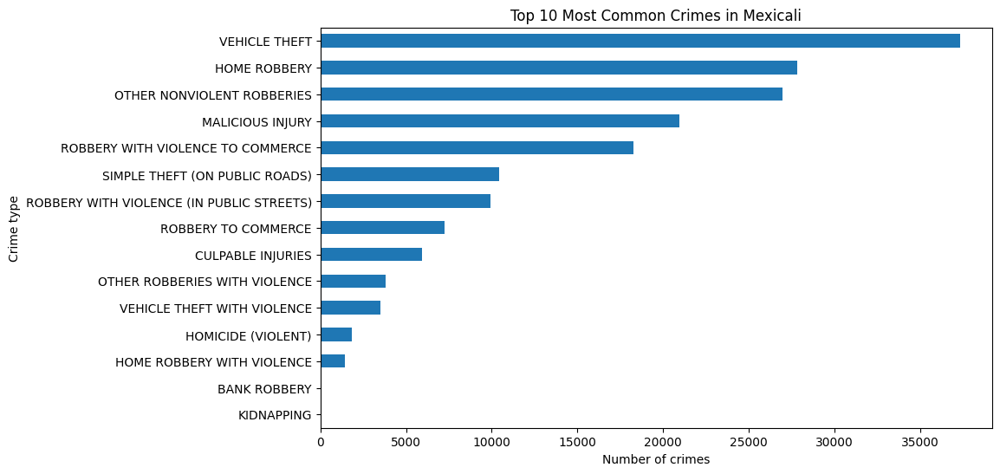

In [117]:
crime_counts = df["CRIME_CLASSIFICATION"].value_counts().head(15)
plt.figure(figsize=(10,6))
crime_counts.plot(kind="barh")
plt.title("Top 10 Most Common Crimes in Mexicali")
plt.xlabel("Number of crimes")
plt.ylabel("Crime type")
plt.gca().invert_yaxis()
plt.show()

In [118]:
import folium
from folium.plugins import HeatMap

# Centro aproximado de Mexicali
m = folium.Map(location=[32.6245, -115.4523], zoom_start=11)

# Agregar puntos al Heatmap (solo donde hay coordenadas válidas)
heat_data = df.dropna(subset=["Y","X"])[["Y","X"]].values.tolist()
HeatMap(heat_data, radius=12, blur=15).add_to(m)

m.save("crime_heatmap.html")
m

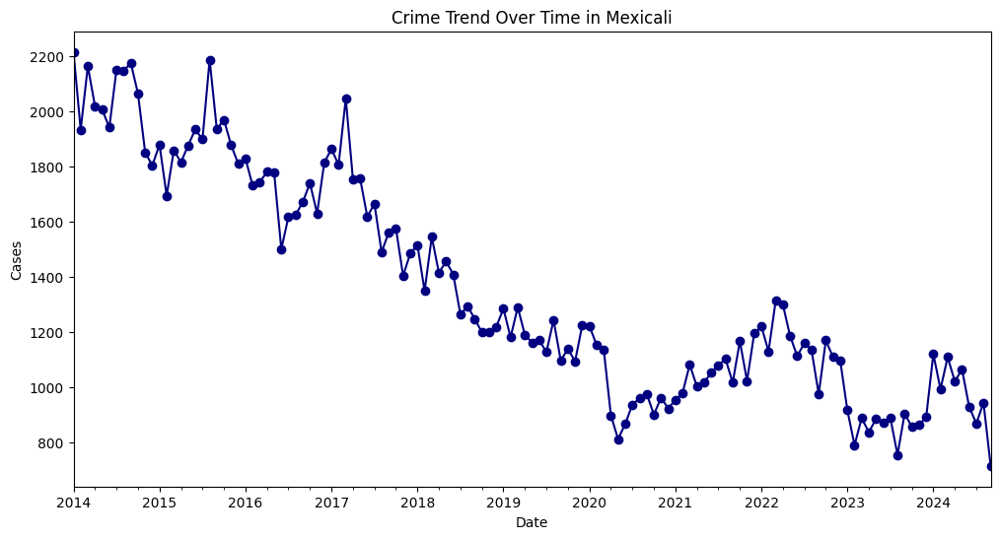

In [119]:
df["OCCURRED_DATE"] = pd.to_datetime(df["OCCURRED_DATE"])
monthly_trend = df.groupby(df["OCCURRED_DATE"].dt.to_period("M")).size()

plt.figure(figsize=(12,6))
monthly_trend.plot(marker="o", color="navy")
plt.title("Crime Trend Over Time in Mexicali")
plt.xlabel("Date")
plt.ylabel("Cases")
plt.show()

As can be seen, 2017 was the year with the highest number of crimes committed in Mexicali, although there was a decline afterwards. In 2020, there was another decline, with fewer crimes reported, coinciding with the COVID pandemic and quarantine.

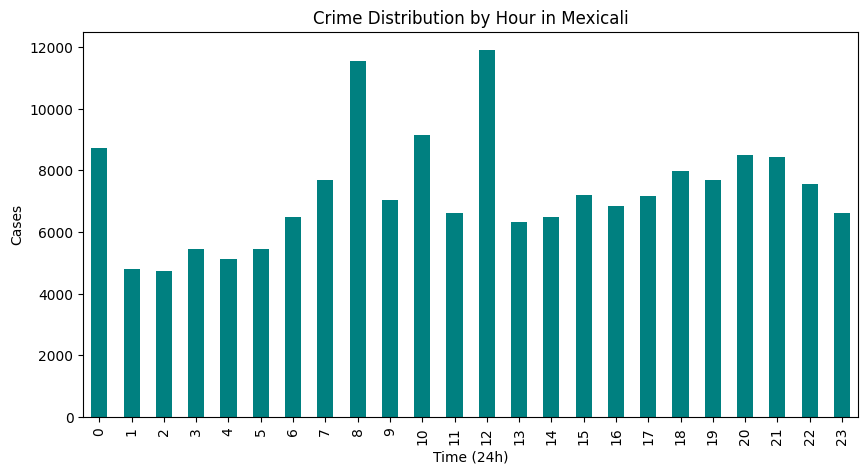

In [120]:
plt.figure(figsize=(10,5))
df["CRIME_TIME"].value_counts().sort_index().plot(kind="bar", color="teal")
plt.title("Crime Distribution by Hour in Mexicali")
plt.xlabel("Time (24h)")
plt.ylabel("Cases")
plt.show()

8 AM and 12 PM happens to be the peak hours for crimes in Mexicali. These hours might correspond to busy times of the day when people are commuting, working, or engaging in various activities, which could lead to increased opportunities for criminal activities.

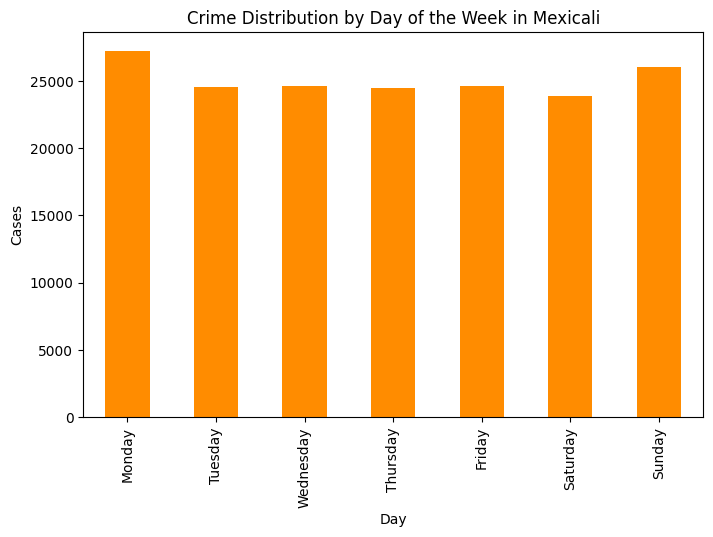

In [121]:
order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]

plt.figure(figsize=(8,5))
df["DayOccurred"].value_counts().reindex(order).plot(kind="bar", color="darkorange")
plt.title("Crime Distribution by Day of the Week in Mexicali")
plt.xlabel("Day")
plt.ylabel("Cases")
plt.show()


Although it seems to be a fairly balanced proportion in terms of the days on which crimes are committed, for some curious reason there is an increase on Mondays. This could be because it is the time when most crimes are reported, as it is when offices are open.

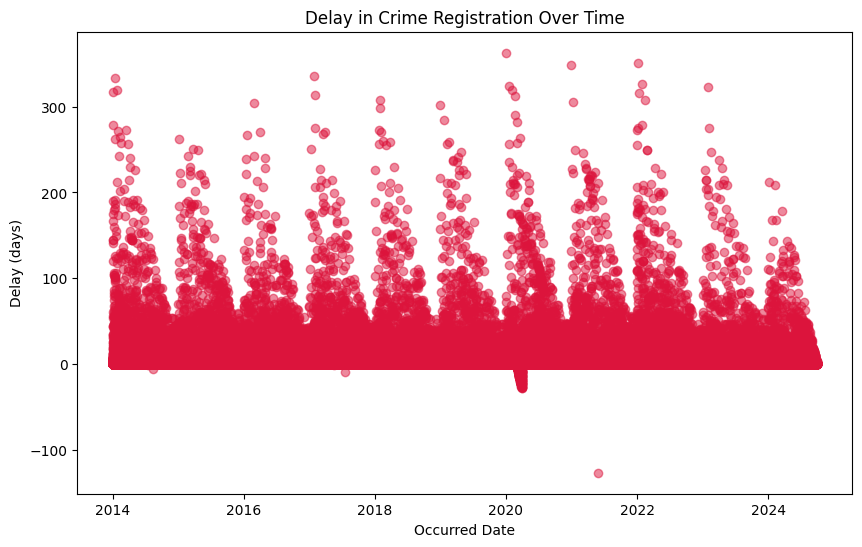

In [122]:
df["REGISTRATION_DATE"] = pd.to_datetime(df["REGISTRATION_DATE"])
df["delay_days"] = (df["REGISTRATION_DATE"] - df["OCCURRED_DATE"]).dt.days

plt.figure(figsize=(10,6))
plt.scatter(df["OCCURRED_DATE"], df["delay_days"], alpha=0.5, c="crimson")
plt.title("Delay in Crime Registration Over Time")
plt.xlabel("Occurred Date")
plt.ylabel("Delay (days)")
plt.show()

There is not actually a serious delay between the days a crime is commited and reported but there are some exceptions

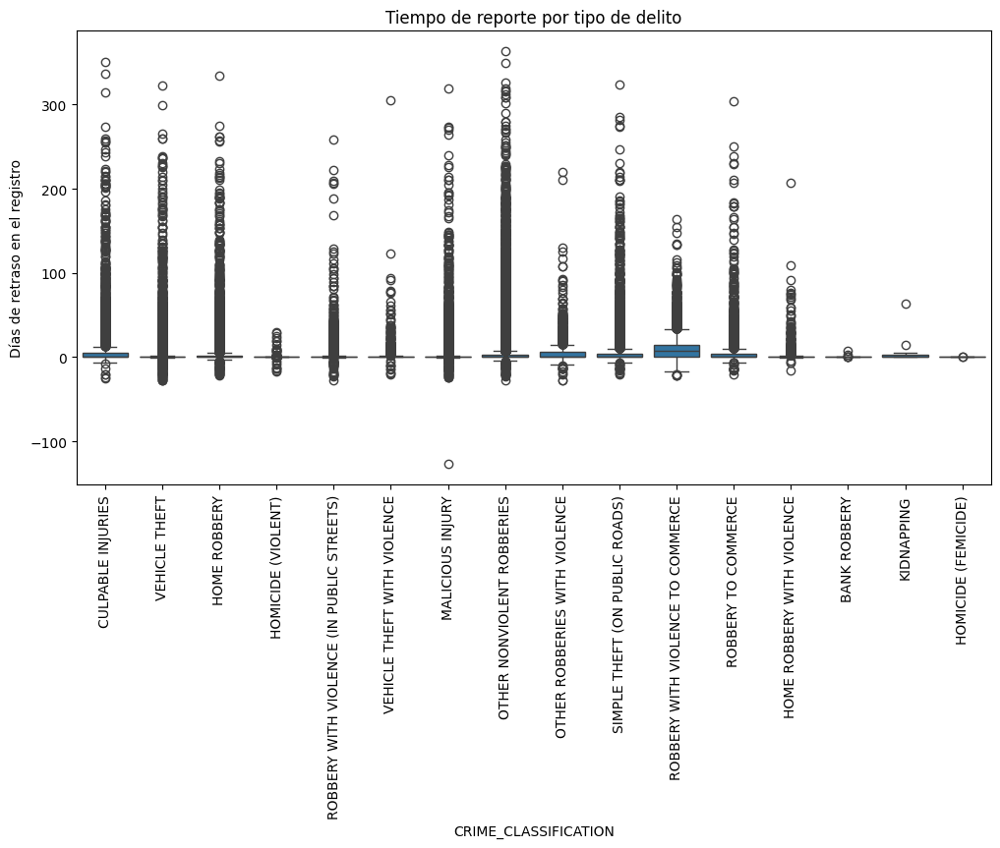

In [123]:
plt.figure(figsize=(12,6))
sns.boxplot(x="CRIME_CLASSIFICATION", y="delay_days", data=df)
plt.xticks(rotation=90)
plt.title("Tiempo de reporte por tipo de delito")
plt.ylabel("Días de retraso en el registro")
plt.show()

Bank robberies are the crimes that have less delay in being reported, with an average of 5 days wich can be explained because they are high impact crimes. On the other hand, crimes like domestic violence and sexual abuse have an average delay of 20 days, which can be explained by the social stigma that exists around these types of crimes. Robbery in commerce and robebery with violence have an average delay of 10 days.

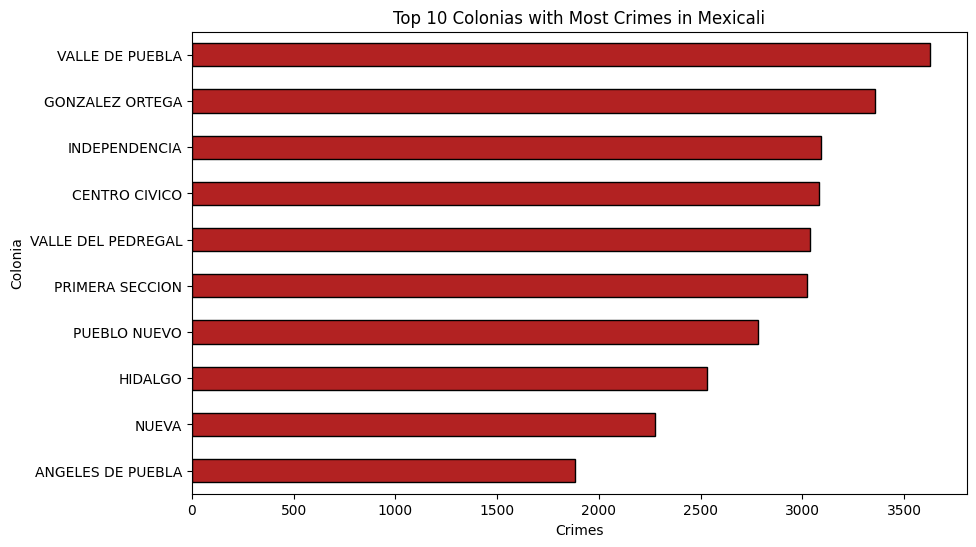

In [124]:
top_colonias = df["CRIME_SCENE"].value_counts().head(10)

plt.figure(figsize=(10,6))
top_colonias.plot(kind="barh", color="firebrick", edgecolor="black")
plt.title("Top 10 Colonias with Most Crimes in Mexicali")
plt.xlabel("Crimes")
plt.ylabel("Colonia")
plt.gca().invert_yaxis() 
plt.show()


In [125]:
import plotly.express as px

df["OCCURRED_DATE"] = pd.to_datetime(df["OCCURRED_DATE"])
df["YearMonth"] = df["OCCURRED_DATE"].dt.to_period("M").astype(str)

fig = px.density_mapbox(
    df.dropna(subset=["Y","X"]),
    lat="Y", lon="X", 
    z=None, radius=12,
    center=dict(lat=32.6245, lon=-115.4523), zoom=11,
    mapbox_style="carto-positron",
    animation_frame="YearMonth",
    title="Evolution of Crime Density in Mexicali Over Time"
)
fig.show()


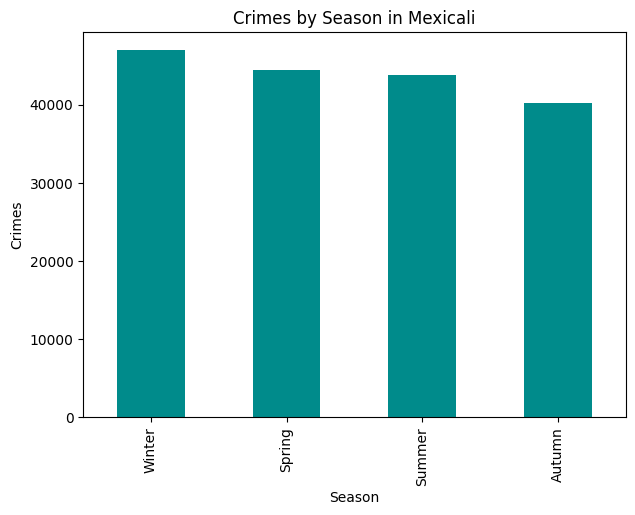

In [126]:
df["OCCURRED_DATE"] = pd.to_datetime(df["OCCURRED_DATE"])
df["Season"] = df["OCCURRED_DATE"].dt.quarter.map({
    1: "Winter",
    2: "Spring",
    3: "Summer",
    4: "Autumn"
})

season_counts = df["Season"].value_counts()

plt.figure(figsize=(7,5))
season_counts.plot(kind="bar", color="darkcyan")
plt.title("Crimes by Season in Mexicali")
plt.xlabel("Season")
plt.ylabel("Crimes")
plt.show()


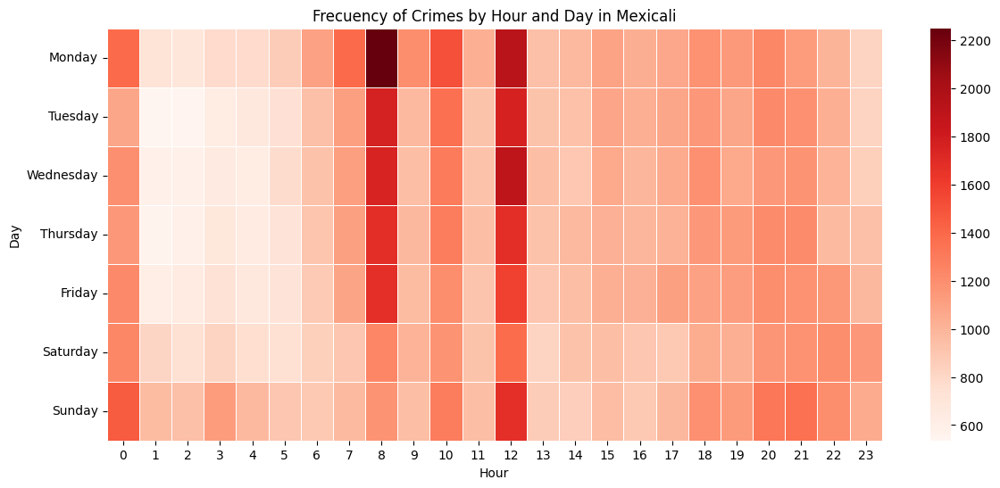

In [127]:
# Preparamos datos
df["CRIME_TIME"] = pd.to_numeric(df["CRIME_TIME"], errors="coerce")
df_pivot = df.pivot_table(
    index="DayOccurred", columns="CRIME_TIME", values="CRIME_CLASSIFICATION", aggfunc="count"
).fillna(0)

# Reordenar días
order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df_pivot = df_pivot.reindex(order)

# Heatmap
plt.figure(figsize=(14,6))
sns.heatmap(df_pivot, cmap="Reds", linewidths=0.5)
plt.title("Frecuency of Crimes by Hour and Day in Mexicali")
plt.xlabel("Hour")
plt.ylabel("Day")
plt.show()

Monday happens to be the day with most crimes commited tih 12 PM being the hour when most crimes are commited. As it was seen in the last graphics, 8 AM and 12 PM are the hours of the day where most crimes are commited. Early morning are the one with less crimes.

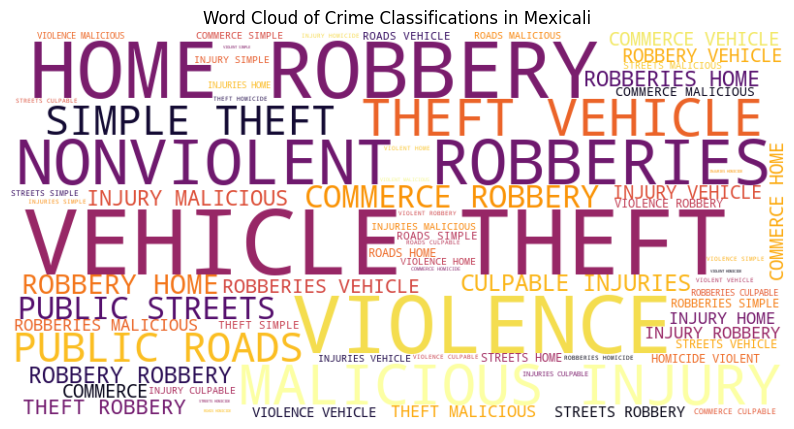

In [128]:
text = " ".join(df["CRIME_CLASSIFICATION"].dropna())
wordcloud = WordCloud(width=800, height=400, background_color="white", colormap="inferno").generate(text)

plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Crime Classifications in Mexicali")
plt.show()

<div style="
    display: inline-flex;
    align-items: center;
    gap: 10px;
    background: linear-gradient(135deg, #F47066, #EFBE7B);
    color: #fff;
    font-size: 1.1rem;
    font-weight: 600;
    padding: 12px 24px;
    box-shadow: 0 6px 14px rgba(0, 0, 0, 0.15);
    letter-spacing: 0.5px;
    transition: transform 0.2s ease, box-shadow 0.2s ease;
    cursor: default;
">
   <span style="font-size: 1.4rem;">🔮</span>
   <span><b>4|</b> Prediction Model</span>
</div>

<style>
div:hover {
   transform: translateY(-2px);
   box-shadow: 0 8px 18px rgba(0,0,0,0.25);
}
</style>

21:34:57 - cmdstanpy - INFO - Chain [1] start processing
21:34:58 - cmdstanpy - INFO - Chain [1] done processing


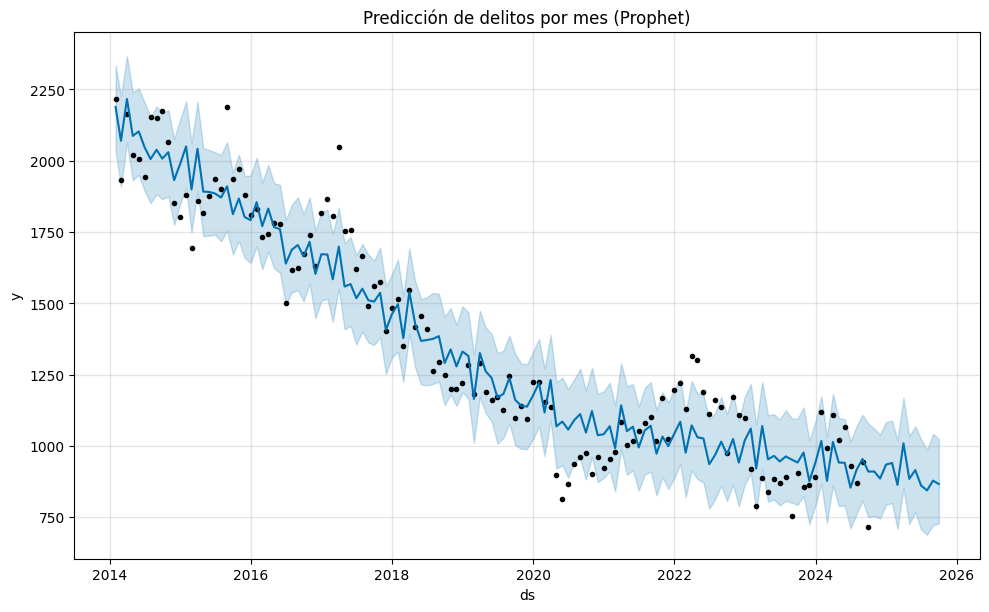

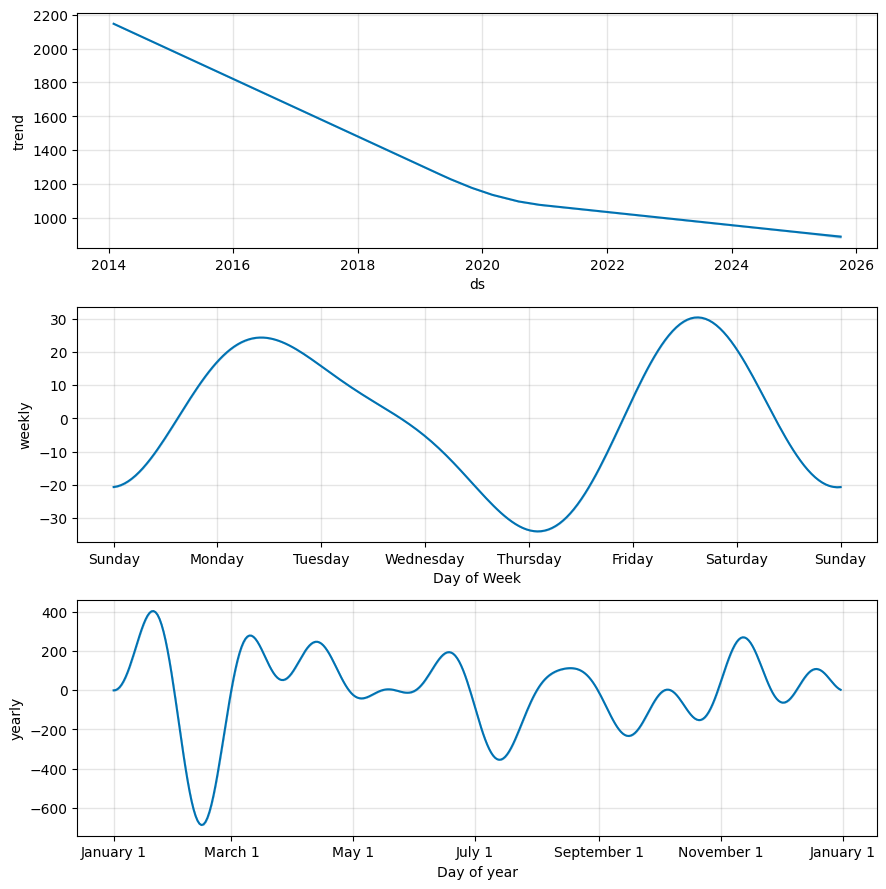

In [129]:
# agrupar delitos por mes
df["OCCURRED_DATE"] = pd.to_datetime(df["OCCURRED_DATE"])
monthly = df.groupby(pd.Grouper(key="OCCURRED_DATE", freq="M")).size().reset_index(name="count")

# preparar para Prophet
monthly = monthly.rename(columns={"OCCURRED_DATE": "ds", "count": "y"})

# modelo
m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
m.fit(monthly)

# predicción 12 meses adelante
future = m.make_future_dataframe(periods=12, freq="M")
forecast = m.predict(future)

# plot
fig1 = m.plot(forecast)
plt.title("Predicción de delitos por mes (Prophet)")
plt.show()

fig2 = m.plot_components(forecast)
plt.show()


In [130]:
# dataframe con lat/lon
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df["X"], df["Y"]), crs="EPSG:4326")

# convertir a proyección métrica
gdf = gdf.to_crs(epsg=3857)

# crear grilla
xmin, ymin, xmax, ymax = gdf.total_bounds
cell_size = 500  # metros
cols = np.arange(xmin, xmax + cell_size, cell_size)
rows = np.arange(ymin, ymax + cell_size, cell_size)

polygons = []
for x in cols[:-1]:
    for y in rows[:-1]:
        polygons.append(Polygon([(x,y), (x+cell_size,y), (x+cell_size,y+cell_size), (x,y+cell_size)]))

grid = gpd.GeoDataFrame({"geometry":polygons}, crs=gdf.crs)

# contar delitos por celda
joined = gpd.sjoin(gdf, grid, predicate="within")
counts = joined.groupby("index_right").size()
grid["crime_count"] = counts.fillna(0)


In [131]:
# variable target: hotspot si > p80 de delitos
threshold = grid["crime_count"].quantile(0.8)
grid["hotspot"] = (grid["crime_count"] >= threshold).astype(int)

# features: (ej. coordenadas + mes)
grid["x"] = grid.geometry.centroid.x
grid["y"] = grid.geometry.centroid.y

X = grid[["x","y"]]
y = grid["hotspot"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = RandomForestClassifier()
model.fit(X_train, y_train)

y_pred = model.predict_proba(X_test)[:,1]


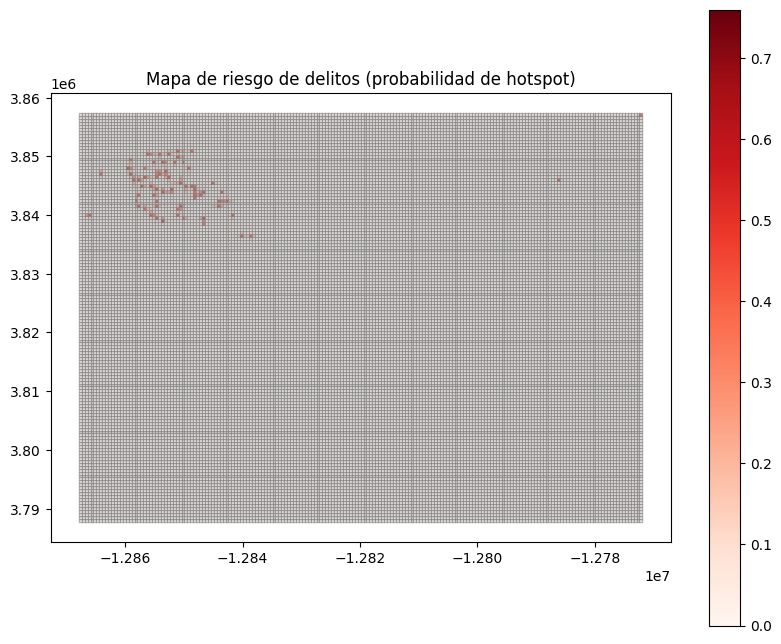

In [132]:
grid["risk"] = model.predict_proba(X)[:,1]

fig, ax = plt.subplots(figsize=(10,8))
grid.plot(column="risk", cmap="Reds", legend=True, ax=ax, alpha=0.6, edgecolor="grey")
plt.title("Mapa de riesgo de delitos (probabilidad de hotspot)")
plt.show()